<a href="https://colab.research.google.com/github/a-aron-j/Anomaly-Detection-For-Semiconductor-Wafers/blob/main/dev/Anomaly_Detection_For_Semiconductor_Wafers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [ ]:
!pip install lightning tensorboard missingno dash pingouin ray[tune]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 808.5/808.5 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 39.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.9/198.9 kB 23.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.7/65.7 MB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 57.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 812.3/812.3 kB 41.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 15.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (4

In [ ]:
# Imports
import re
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import itertools
import missingno as msno
import pingouin as pg
from scipy import stats
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
plt.style.use('ggplot')
%matplotlib inline
import plotly.express as px
import os

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE


import torch
import torch.nn as nn
#import lightning as pl
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, TensorDataset
from lightning.pytorch.callbacks import Callback, LearningRateMonitor, ModelCheckpoint
from torch.utils.tensorboard import SummaryWriter
import lightning.pytorch as pl
import torch.nn.functional as F
from lightning.pytorch.loggers import TensorBoardLogger

from ray import tune
from ray.tune.schedulers import ASHAScheduler
from ray.tune.integration.pytorch_lightning import TuneReportCheckpointCallback
from lightning.pytorch.callbacks import ModelCheckpoint




In [ ]:
pd.options.mode.chained_assignment = None  # default='warn'

# Data Preprocessing

In [ ]:
# Data Ingestion
df = pd.read_csv('/content/drive/MyDrive/XFAB/Tool_Sensor_Data.csv')

In [ ]:
# First 5 rows of dataframe
df.head(5)

,TimeStamp,ToolName,TOOL_ID,Run,RunStartTime,DATA_QUALITY,EQPType,HasComments,LOT_ID,LogicalRecipeID,...,yqScxEFPLde,jrsnDLYHnMHD,CalcStepSeq,CalcLoopSeq,RunTag,Unnamed: 85,Unnamed: 86,Unnamed: 87,Unnamed: 88,Unnamed: 89
0,21/3/2023 19:14,A,A,62301,12:14:19 AM,63.49,A,0,A,A,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,21/3/2023 19:14,A,A,62301,12:14:19 AM,63.49,A,0,A,A,...,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2,21/3/2023 19:14,A,A,62301,12:14:19 AM,63.49,A,0,A,A,...,NaN,NaN,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN
3,21/3/2023 19:14,A,A,62301,12:14:19 AM,63.49,A,0,A,A,...,NaN,NaN,3.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN
4,21/3/2023 19:14,A,A,62301,12:14:19 AM,63.49,A,0,A,A,...,NaN,NaN,4.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN


(14844, 90)

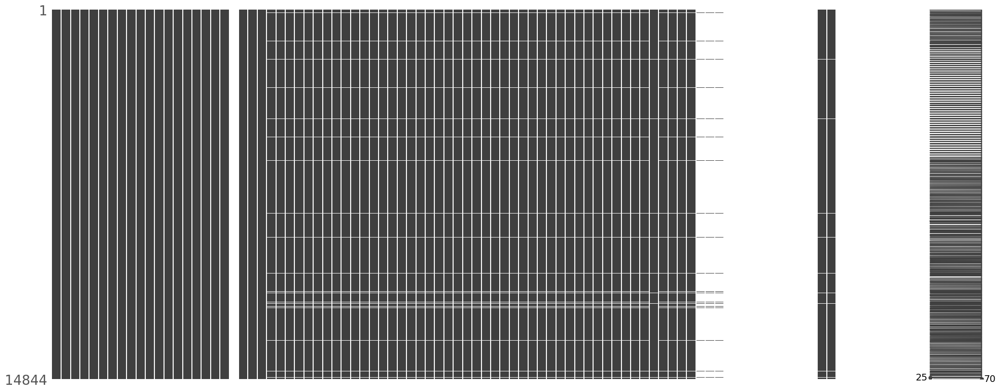

In [ ]:
# Check missing values
msno.matrix(df)

# Dataframe shape
df.shape


In [ ]:
# To decide whether missing data is Missing Completely At Random (MCAR),
# If it is, we can discard it

from scipy.stats import chi2_contingency

def little_mcar_test(data):
    """
    Perform Little's MCAR test on a given dataset.

    Parameters:
    data (pd.DataFrame): The input dataset.

    Returns:
    dict: A dictionary containing the chi-square statistic, p-value, degrees of freedom, and expected counts.
    """
    # Create a DataFrame to store the missingness patterns
    missing_patterns = data.isnull()

    # Calculate the observed frequencies of each missingness pattern
    observed_freq = missing_patterns.value_counts(normalize=True)

    # Calculate the expected frequencies of each missingness pattern
    expected_freq = np.full(len(observed_freq), 1 / len(observed_freq))

    # Create a contingency table
    contingency_table = pd.DataFrame({
        'Observed': observed_freq,
        'Expected': expected_freq
    })

    # Perform the chi-square test
    chi2, p, dof, expected = chi2_contingency(contingency_table[['Observed', 'Expected']].values)

    # Return the results
    results = {
        'chi2': chi2,
        'p-value': p,
        'dof': dof,
        'expected': expected
    }

    return results

In [ ]:
# Perform Little's MCAR test
results = little_mcar_test(df)

# Print the results
print("Little's MCAR Test Results:")
for key, value in results.items():
    print(f"{key}: {value}")

# Check if p-value is available and print the conclusion
if results['p-value'] > 0.05:
    print("The data is MCAR.")
else:
    print("The data is not MCAR.")

Little's MCAR Test Results:
chi2: 0.8903957605804838
p-value: 0.640697482084009
dof: 2
expected: [[0.65130693 0.65130693]
 [0.17434654 0.17434654]
 [0.17434654 0.17434654]]
The data is MCAR.


In [ ]:
def pipeline_0(df, threshold_percentage):
    # Step 1: Identify columns with missing values more than specified threshold
    # Missing Completely At Random (MCAR), hence discard missing columns
    # Calculate the threshold
    threshold = len(df) * threshold_percentage
    columns_to_remove = df.columns[df.isnull().sum() > threshold]


    # Step 2: Identify columns with only one unique value
    # No statistical significance
    columns_with_one_unique_value = df.columns[df.nunique() <= 1]


    # Step 3: Remove identified columns
    # Combine both sets of columns to be removed
    columns_to_remove = columns_to_remove.union(columns_with_one_unique_value)
    removed_columns = list(columns_to_remove)

    # Drop the identified columns from the dataframe
    df_processed = df.drop(columns=columns_to_remove)


    # Step 4: Remove rows with any missing values
    # Missing Completely At Random (MCAR), hence discard missing rows
    df_processed = df_processed.dropna()

    return removed_columns, df_processed

In [ ]:
removed_columns, df = pipeline_0(df, 0.5)
print("Removed columns:", removed_columns)

Removed columns: ['AlarmCode', 'AlarmStatus', 'CYiycrAoYbg', 'EHVtYhnRGb', 'EQPType', 'EventDescription', 'EventId', 'EventName', 'EventSource', 'EventType', 'GPTmghByqMSY', 'HasComments', 'HxXxxvS', 'LogicalRecipeID', 'LotPurposeType', 'LotType', 'LqnSjZtcJs', 'NyUITkJtCGK', 'ReticleID', 'RunTag', 'SYklrMAXe', 'TOOL_ID', 'ToolName', 'Unnamed: 85', 'Unnamed: 86', 'Unnamed: 87', 'Unnamed: 88', 'Unnamed: 89', 'VcnDxeRWVfK', 'WTcLPnkDtRwBuCou', 'XSOeMfJAB', 'YDlkDLfFEEi', 'iezpXSIRyQ', 'jQVGDTFl', 'jrsnDLYHnMHD', 'oUWQRhjudAd', 'pZXcGFNpzPf', 'taQyPEGv', 'vmZiUljnYP', 'yqScxEFPLde']


(14388, 50)

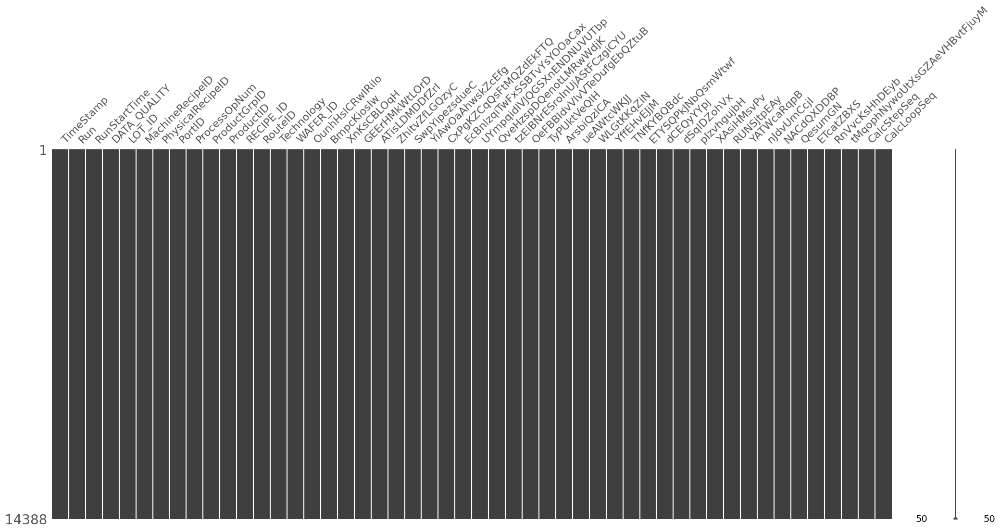

In [ ]:
# Verify if missing values are removed
msno.matrix(df)

# Dataframe shape
df.shape

In [ ]:
from IPython.display import display
display(df)

,TimeStamp,Run,RunStartTime,DATA_QUALITY,LOT_ID,MachineRecipeID,PhysicalRecipeID,PortID,ProcessOpNum,ProductGrpID,...,RUNSjtpEAy,YATWcaRqpB,nJdvUmCcjI,NACdQXDDBP,QesumGN,ETcatZBXS,RnVvcKsHhDEyb,tMqophNywoUtXsGZAeVHBvtFjuyM,CalcStepSeq,CalcLoopSeq
1,21/3/2023 19:14,62301,12:14:19 AM,63.49,A,A,A,A,A,A,...,0.0,0.0,0.0,0.0,2.0,500.0,81.0,-25.0,1.0,1.0
2,21/3/2023 19:14,62301,12:14:19 AM,63.49,A,A,A,A,A,A,...,12.0,5.0,1304.0,3110.0,7.0,300.0,81.0,1890.0,2.0,2.0
3,21/3/2023 19:14,62301,12:14:19 AM,63.49,A,A,A,A,A,A,...,8.0,4.0,1305.0,3107.0,8.0,300.0,81.0,1890.0,3.0,3.0
4,21/3/2023 19:14,62301,12:14:19 AM,63.49,A,A,A,A,A,A,...,6.0,3.0,1302.0,3104.0,9.0,6200.0,81.0,1890.0,4.0,4.0
5,21/3/2023 19:14,62301,12:14:19 AM,63.49,A,A,A,A,A,A,...,4.0,2.0,1302.0,3103.0,11.0,1400.0,81.0,1890.0,5.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14838,24/3/2023 0:00,62600,12:58:04 AM,70.28,W,A,A,B,A,N,...,9.0,7.0,1306.0,3108.0,19.0,2900.0,114.0,1890.0,9.0,9.0
14839,24/3/2023 0:00,62600,12:58:04 AM,70.28,W,A,A,B,A,N,...,12.0,2.0,1001.0,2013.0,21.0,700.0,114.0,1890.0,10.0,10.0
14840,24/3/2023 0:01,62600,12:58:04 AM,70.28,W,A,A,B,A,N,...,2.0,2.0,1001.0,2005.0,22.0,700.0,114.0,1890.0,11.0,11.0
14841,24/3/2023 0:01,62600,12:58:04 AM,70.28,W,A,A,B,A,N,...,2.0,2.0,1001.0,2005.0,22.0,3000.0,114.0,1890.0,11.0,11.0


# Exploratory Data Analysis

In [ ]:
import seaborn as sns
from scipy import stats

In [ ]:
# Display basic information about the dataset
print("Basic Information:")
print(df.info())

# Summary statistics for numerical columns
print("\nSummary Statistics (Numerical):")
print(df.describe())

Basic Information:
<class 'pandas.core.frame.DataFrame'>
Index: 14388 entries, 1 to 14842
Data columns (total 50 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   TimeStamp                     14388 non-null  object 
 1   Run                           14388 non-null  int64  
 2   RunStartTime                  14388 non-null  object 
 3   DATA_QUALITY                  14388 non-null  float64
 4   LOT_ID                        14388 non-null  object 
 5   MachineRecipeID               14388 non-null  object 
 6   PhysicalRecipeID              14388 non-null  object 
 7   PortID                        14388 non-null  object 
 8   ProcessOpNum                  14388 non-null  object 
 9   ProductGrpID                  14388 non-null  object 
 10  ProductID                     14388 non-null  object 
 11  RECIPE_ID                     14388 non-null  object 
 12  RouteID                       14388 non-null  

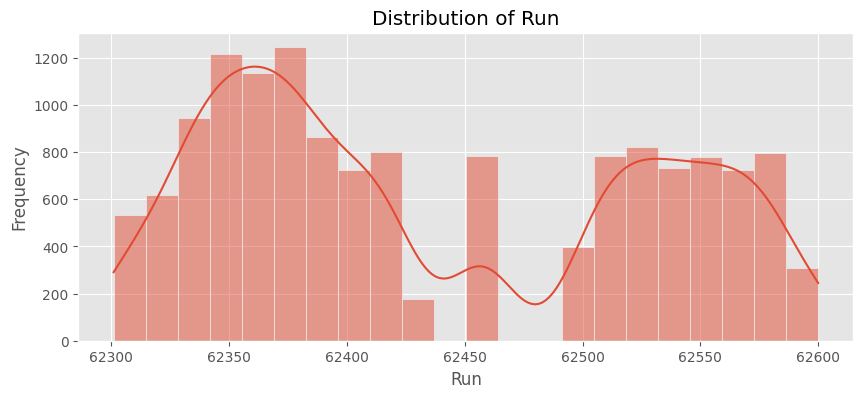

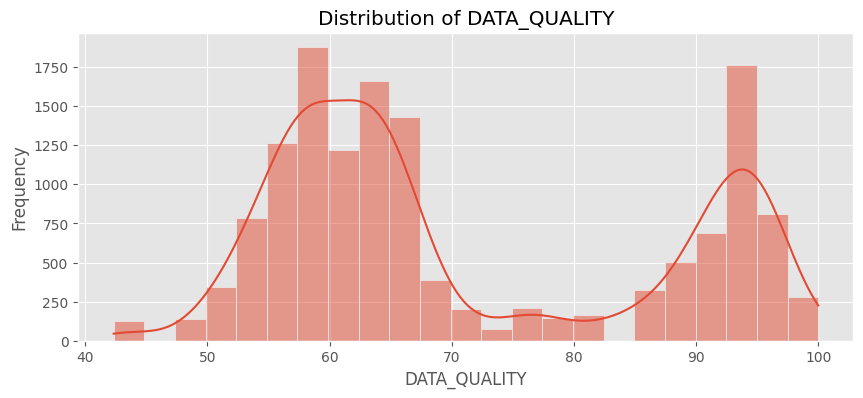

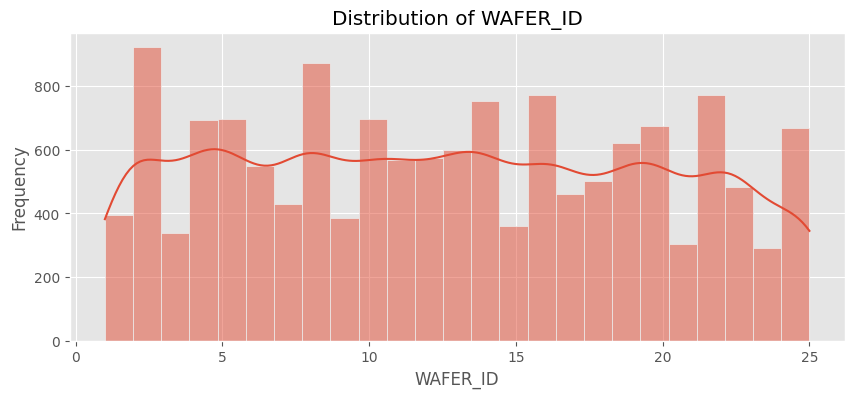

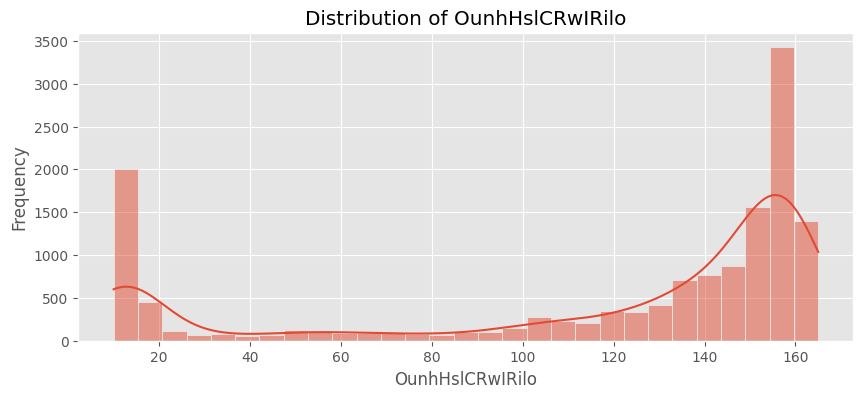

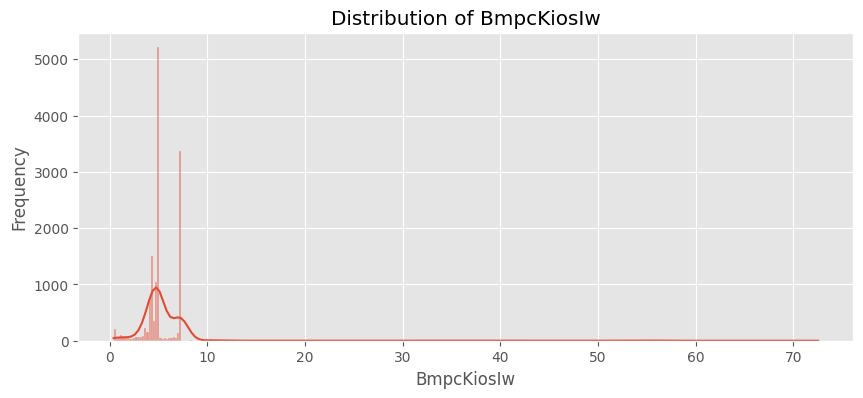

...

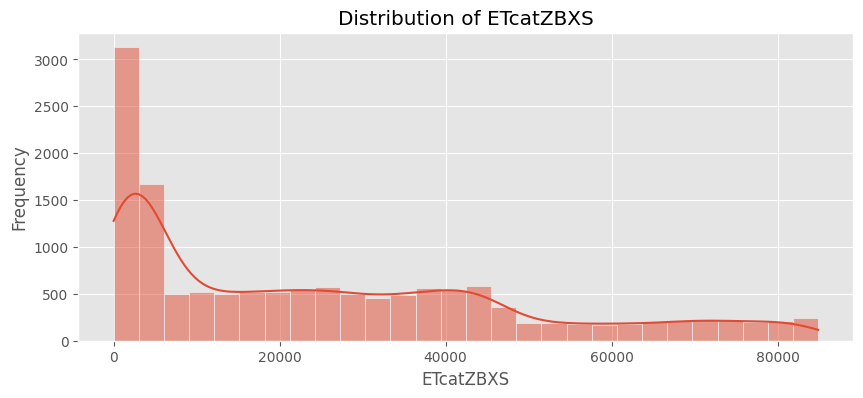

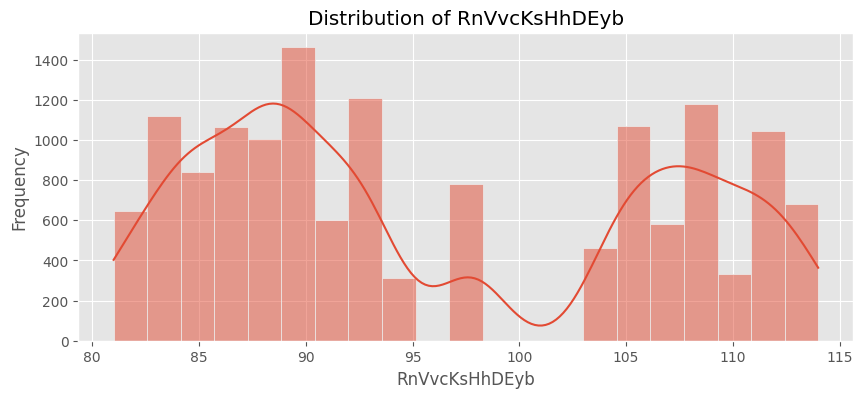

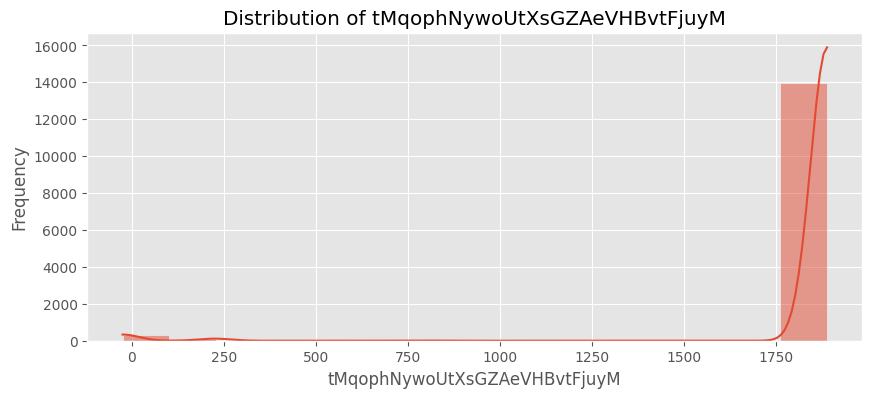

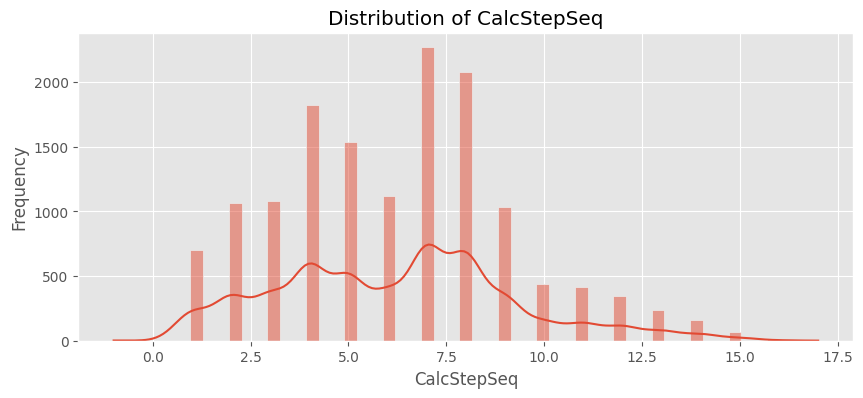

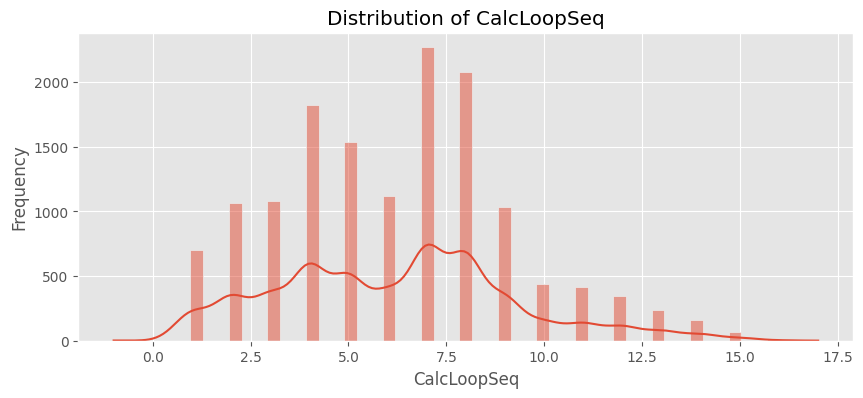

In [ ]:
# Distribution of numerical columns
def plot_numerical_distribution(df):
    numerical_cols = df.select_dtypes(include=[np.number]).columns
    for col in numerical_cols:
        plt.figure(figsize=(10, 4))
        sns.histplot(df[col].dropna(), kde=True)
        plt.title(f'Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.show()

plot_numerical_distribution(df)


Correlation Matrix:


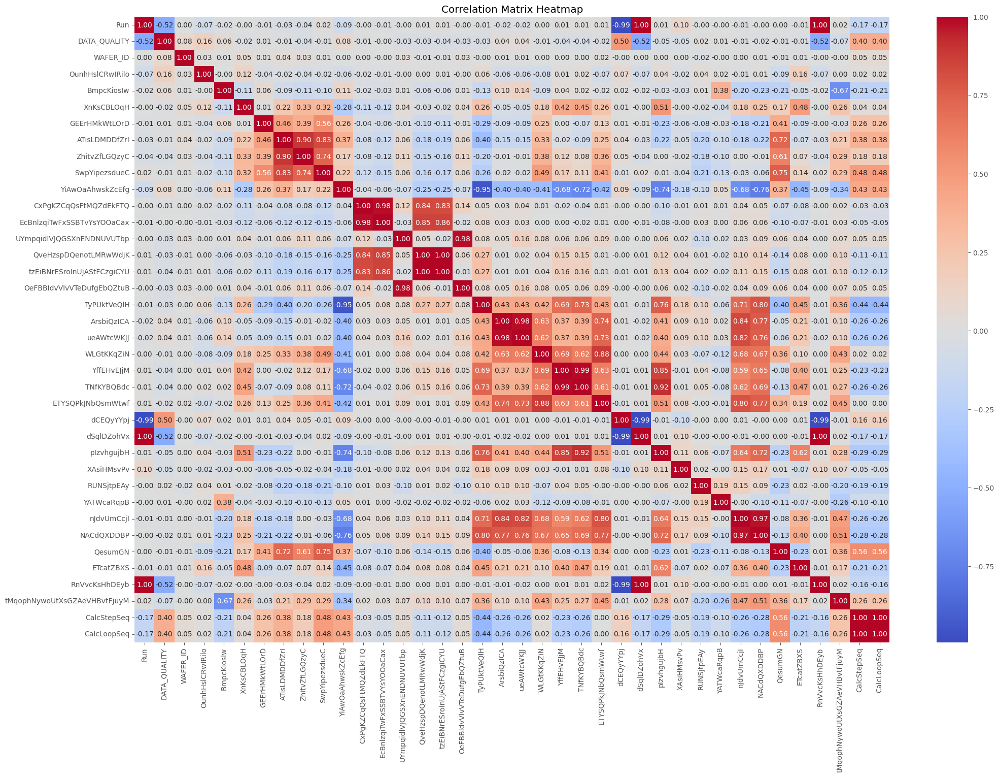

In [ ]:
# Correlation matrix for numerical columns
print("\nCorrelation Matrix:")
correlation_matrix = df.select_dtypes(include=[np.number]).corr()

# Heatmap of the correlation matrix
plt.figure(figsize=(24, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()

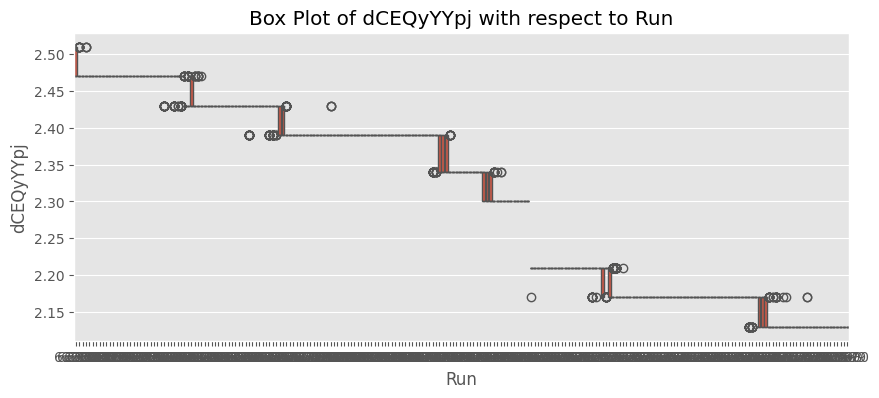

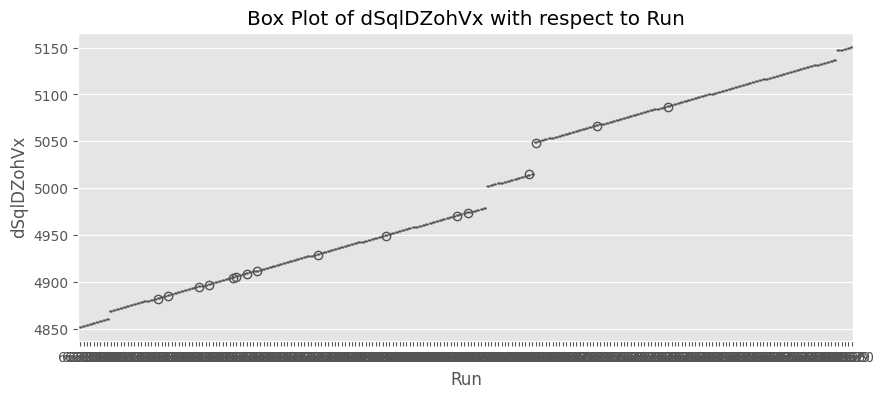

In [ ]:
# Box plots for numerical columns highly correlated to the column Run
def plot_box_plots(df, categorical_column, numerical_columns):
    numerical_cols = numerical_columns
    for col in numerical_cols:
        plt.figure(figsize=(10, 4))
        sns.boxplot(x=categorical_column, y=col, data=df)
        plt.title(f'Box Plot of {col} with respect to {categorical_column}')
        plt.xlabel(categorical_column)
        plt.ylabel(col)
        plt.show()

plot_box_plots(df, 'Run', ['dCEQyYYpj','dSqlDZohVx'])

In [ ]:
# Function to detect outliers using Z-score and return the outliers counts
def detect_outliers_zscore(df, threshold=3):
    numerical_cols = df.select_dtypes(include=[np.number]).columns
    outliers = pd.DataFrame(index=df.index)
    outlier_counts = {}
    for col in numerical_cols:
        z_scores = stats.zscore(df[col].dropna())
        col_outliers = np.abs(z_scores) > threshold
        outliers[col] = col_outliers
        outlier_counts[col] = col_outliers.sum()
    # Filter to keep only rows that have at least one True value
    outlier_rows = outliers.any(axis=1)
    return df[outlier_rows], outlier_counts

# Detect outliers and store them in a DataFrame
outliers, outlier_counts = detect_outliers_zscore(df)

# Print the sum of outliers detected in each column
print("\nSum of Outliers Detected in Each Column:")
for col, count in outlier_counts.items():
    print(f"{col}: {count}")


Sum of Outliers Detected in Each Column:
Run: 0
DATA_QUALITY: 0
WAFER_ID: 0
OunhHslCRwIRilo: 0
BmpcKiosIw: 205
XnKsCBLOqH: 164
GEErHMkWtLOrD: 8
ATisLDMDDfZrI: 0
ZhitvZfLGQzyC: 15
SwpYipezsdueC: 0
YiAwOaAhwskZcEfg: 8
CxPgKZCqQsFtMQZdEkFTQ: 101
EcBnlzqiTwFxSSBTvYsYOOaCax: 95
UYmpqidlVJQGSXnENDNUVUTbp: 20
QveHzspDQenotLMRwWdjK: 151
tzEiBNrESroInUjAStFCzgiCYU: 150
OeFBBIdvVlvVTeDufgEbQZtuB: 27
TyPUktVeQlH: 0
ArsbiQzICA: 695
ueAWtcWKJJ: 736
WLGtKKqZiN: 0
YffEHvEJjM: 0
TNfKYBQBdc: 0
ETYSQPkJNbQsmWtwf: 504
dCEQyYYpj: 0
dSqlDZohVx: 0
pIzvhgujbH: 0
XAsiHMsvPv: 197
RUNSjtpEAy: 65
YATWcaRqpB: 93
nJdvUmCcjI: 908
NACdQXDDBP: 917
QesumGN: 137
ETcatZBXS: 0
RnVvcKsHhDEyb: 0
tMqophNywoUtXsGZAeVHBvtFjuyM: 403
CalcStepSeq: 12
CalcLoopSeq: 12


# Feature Engineering & Selection

### Pipeline 1

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

def pipeline_1(df, timestamp_cols, test_size, random_state, mode, preprocessor=None):
    """
    Preprocesses the input DataFrame by dropping timestamp columns, scaling numerical features,
    one-hot encoding categorical features, and preparing training data.

    Parameters:
    - df (pd.DataFrame): The input DataFrame to be preprocessed.
    - timestamp_cols (list): List of columns to drop related to timestamps. Default is ['TimeStamp', 'RunStartTime'].
    - test_size (float): The proportion of the dataset to include in the test split. Default is 0.2.
    - random_state (int): Random seed for reproducibility. Default is 42.
    - mode (str): Mode of operation, either 'train' or 'inference'. Default is 'train'.
    - preprocessor (ColumnTransformer): Fitted ColumnTransformer instance for 'inference' mode. Default is None.

    Returns:
    - X_train (pd.DataFrame): Preprocessed training feature data.
    - all_feature_names (list): List of feature names after one-hot encoding.
    - X_val_df (pd.DataFrame): Preprocessed validation feature data (if X_test is provided).
    """
    # Drop timestamp columns
    # The models we use (LSTM AutoEncoders) to detect anomalies in the time-series data will use the sequence of the data as the temporal feature, not the timestamp
    df = df.drop(columns=timestamp_cols)

    # Define columns
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    if mode == 'train':
        # Split data before transformations to prevent data leakage
        X_train, X_val = train_test_split(df, test_size=test_size, random_state=random_state)

        # Preprocessing
        preprocessor = ColumnTransformer(
            transformers=[
                ('num', StandardScaler(), numerical_cols),
                ('cat', OneHotEncoder(), categorical_cols)
            ])

        # Prepare data
        X_train = preprocessor.fit_transform(X_train)
        X_val = preprocessor.transform(X_val)

        # Get feature names after OneHotEncoder transformation
        onehot_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_cols)
        all_feature_names = numerical_cols + onehot_feature_names.tolist()

        # Convert csr_matrix to DataFrame
        X_train = pd.DataFrame(X_train, columns=all_feature_names)
        X_val = pd.DataFrame(X_val, columns=all_feature_names)

        return X_train, X_val, all_feature_names, preprocessor

    elif mode == 'inference':
        if preprocessor is None:
            raise ValueError("For inference mode, a fitted preprocessor must be provided.")

        # Prepare data
        X_inference = preprocessor.transform(df)

        # Get feature names after OneHotEncoder transformation
        onehot_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_cols)
        all_feature_names = numerical_cols + onehot_feature_names.tolist()

        # Convert csr_matrix to DataFrame
        X_inference = pd.DataFrame(X_inference, columns=all_feature_names)

        return X_inference, all_feature_names

    else:
        raise ValueError("Invalid mode. Please use 'train' or 'inference'.")

In [ ]:
# Pipeline 1
# As this is unsupervised learning (as we have no labels), we would want to use all of our dataset as our training set
X_train, X_val, all_feature_names, preprocessor = pipeline_1(df, ['TimeStamp', 'RunStartTime'], test_size=0.00001, random_state=42, mode='train')
print(X_train.shape)
print(X_val.shape)
print(all_feature_names)

(14387, 122)
(1, 122)
['Run', 'DATA_QUALITY', 'WAFER_ID', 'OunhHslCRwIRilo', 'BmpcKiosIw', 'XnKsCBLOqH', 'GEErHMkWtLOrD', 'ATisLDMDDfZrI', 'ZhitvZfLGQzyC', 'SwpYipezsdueC', 'YiAwOaAhwskZcEfg', 'CxPgKZCqQsFtMQZdEkFTQ', 'EcBnlzqiTwFxSSBTvYsYOOaCax', 'UYmpqidlVJQGSXnENDNUVUTbp', 'QveHzspDQenotLMRwWdjK', 'tzEiBNrESroInUjAStFCzgiCYU', 'OeFBBIdvVlvVTeDufgEbQZtuB', 'TyPUktVeQlH', 'ArsbiQzICA', 'ueAWtcWKJJ', 'WLGtKKqZiN', 'YffEHvEJjM', 'TNfKYBQBdc', 'ETYSQPkJNbQsmWtwf', 'dCEQyYYpj', 'dSqlDZohVx', 'pIzvhgujbH', 'XAsiHMsvPv', 'RUNSjtpEAy', 'YATWcaRqpB', 'nJdvUmCcjI', 'NACdQXDDBP', 'QesumGN', 'ETcatZBXS', 'RnVvcKsHhDEyb', 'tMqophNywoUtXsGZAeVHBvtFjuyM', 'CalcStepSeq', 'CalcLoopSeq', 'LOT_ID_A', 'LOT_ID_B', 'LOT_ID_C', 'LOT_ID_D', 'LOT_ID_E', 'LOT_ID_F', 'LOT_ID_G', 'LOT_ID_H', 'LOT_ID_I', 'LOT_ID_J', 'LOT_ID_K', 'LOT_ID_L', 'LOT_ID_M', 'LOT_ID_N', 'LOT_ID_O', 'LOT_ID_P', 'LOT_ID_Q', 'LOT_ID_R', 'LOT_ID_S', 'LOT_ID_T', 'LOT_ID_U', 'LOT_ID_V', 'LOT_ID_W', 'MachineRecipeID_A', 'MachineRecipeID_B', '

### Feature Selection & Filter

Here we filter the dataset to include only the most important features as we have limited compute. IsolationForest was used to detect anomalies in our dataset and the importance of each feature in detecting anomalies was determined. These important features will then be passed as training data into our main anomaly detection models (LSTM AutoEncoders).

In [ ]:
from sklearn.ensemble import IsolationForest, RandomForestClassifier
from scipy.sparse import csr_matrix

X_train_selected = X_train.copy()

# Initialize and fit the Isolation Forest model
iso_forest = IsolationForest(contamination=0.05, random_state=42)
iso_forest.fit(X_train_selected)

# Predict anomalies
anomalies = iso_forest.predict(X_train_selected)

# Convert anomalies to a DataFrame and add it to X_train_selected
X_train_selected['anomaly'] = anomalies

# Create a synthetic target variable
X_train_selected['target'] = (X_train_selected['anomaly'] == -1).astype(int)

# Fit a Random Forest model to estimate feature importance
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_selected.drop(columns=['anomaly', 'target']), X_train_selected['target'])

# Get feature importances from the Random Forest model
importances = rf_model.feature_importances_

# Create a DataFrame of features and their importances
feature_importance_df = pd.DataFrame({
    'feature': X_train_selected.drop(columns=['anomaly', 'target']).columns,
    'importance': importances
})

# Sort features by importance
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

# Select the top N important features (e.g., top 10 features)
top_n = 15
top_features = feature_importance_df.head(top_n)['feature'].tolist()

# Create a new DataFrame with only the most important features
X_train = X_train_selected[top_features]
print(feature_importance_df.head(top_n))
print(X_train.shape)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


                         feature  importance
18                    ArsbiQzICA    0.090167
20                    WLGtKKqZiN    0.088120
19                    ueAWtcWKJJ    0.077609
30                    nJdvUmCcjI    0.068083
31                    NACdQXDDBP    0.064281
29                    YATWcaRqpB    0.056455
4                     BmpcKiosIw    0.054268
23             ETYSQPkJNbQsmWtwf    0.048560
32                       QesumGN    0.025985
25                    dSqlDZohVx    0.019403
68                ProcessOpNum_B    0.018630
0                            Run    0.018130
5                     XnKsCBLOqH    0.016638
35  tMqophNywoUtXsGZAeVHBvtFjuyM    0.016292
34                 RnVvcKsHhDEyb    0.013964
(14387, 15)


### Pipeline 2

In [ ]:
def pipeline_2(df, batch_size, seq_len):
    """
    Prepares data for LSTM model using the given X_train and df.

    Parameters:
    X_train (pd.DataFrame): The input training data.
    df (pd.DataFrame): The dataframe containing the "Run" column for batch size and sequence length calculations.

    Returns:
    DataLoader: A DataLoader object containing the prepared data.
    """
    print("X_train shape: ", X_train.shape)

    # batch size and sequence length for LSTM
    print("batch_size: ", batch_size)

    print("seq_len: ", seq_len)

    # Step 1: Convert the dataframe to a dense numpy array
    dense_matrix = X_train.to_numpy()
    print("Step 1 Convert the dataframe to a dense numpy array")

    # Step 2: Convert the dense numpy array to a PyTorch tensor
    tensor_data = torch.tensor(dense_matrix, dtype=torch.float32)
    print("Step 2 Convert the dense numpy array to a PyTorch tensor: ", tensor_data.shape)

    # Step 3: Prepare the data for LSTM (assuming each row is a sequence)
    # Create sequences using a sliding window
    sequences = []
    for i in range(tensor_data.shape[0] - seq_len + 1):
        sequences.append(tensor_data[i:i + seq_len])

    sequences = torch.stack(sequences)
    print("Step 3 Create sequences using a sliding window")
    print("No of samples: ", sequences.shape[0])
    print("Length of each sequence: ", sequences.shape[1])
    print("No of features: ", sequences.shape[2])

    # Step 4: Create a TensorDataset and DataLoader
    dataset = TensorDataset(sequences)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    print("Step 4 Create a TensorDataset and DataLoader")

    return dataloader, batch_size, seq_len


In [ ]:
# Define batch size and sequence length
batch_size = X_train.shape[0] // df['Run'].nunique()
seq_len = X_train.shape[0] // df['Run'].nunique()

dataloader, batch_size, seq_len = pipeline_2(X_train, batch_size, seq_len)

X_train shape:  (14387, 15)
batch_size:  63
seq_len:  63
Step 1 Convert the dataframe to a dense numpy array
Step 2 Convert the dense numpy array to a PyTorch tensor:  torch.Size([14387, 15])
Step 3 Create sequences using a sliding window
No of samples:  14325
Length of each sequence:  63
No of features:  15
Step 4 Create a TensorDataset and DataLoader


# Model: LSTM AutoEncoder

LSTMs are used for detecting anomalies in multivariate time series because they excel at capturing long-term dependencies in data sequences, which is essential for accurate anomaly detection. Combining LSTM with an autoencoder enhances the model's ability to learn temporal patterns and effectively identify anomalies. [[1]](https://typeset.io/papers/lstm-autoencoder-based-anomaly-detection-for-indoor-air-168udhmc)

Autoencoders are trained on normal data, learning to reconstruct these inputs accurately. When an anomalous input is presented, the autoencoder struggles to reconstruct it, leading to a higher reconstruction error. This error is then used as a signal to detect anomalies.

These models are unsupervised as we have no labels.



In [ ]:
# Create Model
class LSTMAutoencoder(pl.LightningModule):
    def __init__(self, input_dim, hidden_dim, seq_len, num_layers=2):
        super(LSTMAutoencoder, self).__init__()
        self.encoder = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.decoder = nn.LSTM(hidden_dim, input_dim, num_layers, batch_first=True)
        self.hidden_dim = hidden_dim
        self.seq_len = seq_len

    def forward(self, x):
        # x is now a tensor with shape: [batch_size, seq_len, num_features]
        # Get the encoder's output and hidden state
        _, (hidden, _) = self.encoder(x)

        # For LSTM, the hidden state has shape: (num_layers, batch_size, hidden_dim)
        # We need to reshape it to match the seq_len for the decoder input
        repeated_hidden = hidden[-1].unsqueeze(0).repeat(self.seq_len, 1, 1).permute(1, 0, 2)

        # Perform decoding
        decoded, _ = self.decoder(repeated_hidden)
        return decoded

    def training_step(self, batch, batch_idx):
        x, = batch  # Extract the tensor from the batch
        x_hat = self(x)
        loss = nn.MSELoss()(x_hat, x)
        self.log('train_loss', loss)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3)
        return optimizer

# Usage
num_features = X_train.shape[1]
seq_len = 63
lstm_ae = LSTMAutoencoder(input_dim=num_features, hidden_dim=32, seq_len=seq_len)

# Print the model architecture
print(lstm_ae)

LSTMAutoencoder(
  (encoder): LSTM(15, 32, num_layers=2, batch_first=True)
  (decoder): LSTM(32, 15, num_layers=2, batch_first=True)
)


### Training

In [ ]:
# Train Model
trainer = pl.Trainer(max_epochs=3)
trainer.fit(lstm_ae, dataloader)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type | Params | Mode 
-----------------------------------------
0 | encoder | LSTM | 14.7 K | train
1 | decoder | LSTM | 4.9 K  | train
-----------------------------------------
19.6 K    Trainable params
0         Non-trainable params
19.6 K    Total params
0.078     Total estimated model params size (MB)
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type | Params | Mode 
-----------------------------------------
0 | encoder | LSTM | 14.7 K | train

Training: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=3` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


# Model: LSTM VariationalAutoEncoder (with hyperparameter tuning)

LSTM VariationalAutoEncoders take LSTM AutoEncoders a step further by incorporating a latent space in the model. The latent space is structured in a probabilistic manner, which encourages more meaningful and smooth representations. This can lead to better generalization and robustness in generating and reconstructing data.

In [ ]:
class VariationalLSTMAutoencoder(pl.LightningModule):
    def __init__(self, input_dim, hidden_dim, latent_dim, seq_len, num_layers=2, lr=1e-3):
        super(VariationalLSTMAutoencoder, self).__init__()
        self.encoder = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)

        self.fc_mu = nn.Linear(hidden_dim, latent_dim) #a fully connected layer that maps the hidden state to the mean (mu) of the latent distribution
        self.fc_logvar = nn.Linear(hidden_dim, latent_dim) #a fully connected layer that maps the hidden state to the log variance (logvar) of the latent distribution

        self.decoder = nn.LSTM(latent_dim, hidden_dim, num_layers, batch_first=True)
        self.fc_decoder = nn.Linear(hidden_dim, input_dim) #a fully connected layer that maps the LSTM output to the final decoded sequence

        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim
        self.seq_len = seq_len
        self.lr = lr

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        # Encoder
        _, (hidden, _) = self.encoder(x)
        hidden = hidden[-1]  # Take the last layer's hidden state

        mu = self.fc_mu(hidden)
        logvar = self.fc_logvar(hidden)
        z = self.reparameterize(mu, logvar)

        # Repeat latent vector for each time step in the sequence
        z = z.unsqueeze(1).repeat(1, self.seq_len, 1)

        # Decoder
        decoded, _ = self.decoder(z)
        decoded = self.fc_decoder(decoded)
        return decoded, mu, logvar

    def training_step(self, batch, batch_idx):
        # Unpack the input data from the batch. The batch contains a single tensor, which is the input sequence.
        x, = batch

        # Pass the input sequence through the model to get the reconstructed sequence, mean, and log variance of the latent space.
        x_hat, mu, logvar = self(x)

        # Calculate the reconstruction loss using Mean Squared Error (MSE) between the original and reconstructed sequences.
        recon_loss = F.mse_loss(x_hat, x, reduction='mean')

        # Calculate the Kullback-Leibler Divergence (KLD) loss, which measures the difference between the learned distribution and a standard normal distribution.
        kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

        # Combine the reconstruction loss, KLD loss to get the total loss.
        loss = recon_loss + kld_loss

        # Log the total training loss for monitoring and visualization purposes.
        self.log('train_loss', loss)
        return loss

    def validation_step(self, batch, batch_idx):
        x, = batch
        x_hat, mu, logvar = self(x)
        recon_loss = F.mse_loss(x_hat, x, reduction='mean')
        kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        loss = recon_loss + kld_loss
        self.log('val_loss', loss)
        tensorboard_logs = {'val_loss': loss}
        return {"val_loss": loss}

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
        return optimizer

# Usage
num_features = X_train.shape[1]
seq_len = 63
lstm_vae = VariationalLSTMAutoencoder(input_dim=num_features, hidden_dim=32, latent_dim=10, seq_len=seq_len)

# Print the model architecture
print(lstm_vae)


VariationalLSTMAutoencoder(
  (encoder): LSTM(15, 32, num_layers=2, batch_first=True)
  (fc_mu): Linear(in_features=32, out_features=10, bias=True)
  (fc_logvar): Linear(in_features=32, out_features=10, bias=True)
  (decoder): LSTM(10, 32, num_layers=2, batch_first=True)
  (fc_decoder): Linear(in_features=32, out_features=15, bias=True)
)


### Training with Hyperparameter Tuning

In [ ]:
import ray

# Ensure that Ray is initialized with the spawn method
ray.init(runtime_env={"env_vars": {"RAY_START_METHOD": "spawn"}})

/usr/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(
2024-07-14 17:58:34,024	INFO worker.py:1788 -- Started a local Ray instance.


Python version:,3.10.12
Ray version:,2.32.0


In [ ]:
# Disable strict metric checking
os.environ['TUNE_DISABLE_STRICT_METRIC_CHECKING'] = '1'
#ray.shutdown()

In [ ]:
def train_vae(config, data_module, num_epochs=3, num_gpus=0):
    # Instantiate the model with the given hyperparameters
    lstm_vae = VariationalLSTMAutoencoder(input_dim=config["input_dim"],
                                       hidden_dim=config["hidden_dim"],
                                       latent_dim=config["latent_dim"],
                                       seq_len=config["seq_len"],
                                       num_layers=config["num_layers"],
                                       lr=config["lr"])

    # Set up callbacks including TuneReportCallback and ModelCheckpoint
    callbacks = [
                TuneReportCheckpointCallback(metrics={"val_loss": "val_loss"},
                                     on="validation_end"),
                ModelCheckpoint(monitor="val_loss")
    ]

    # Set up a logger
    logger = TensorBoardLogger("tb_logs", name="vae_model")

    # Set up the trainer
    trainer = pl.Trainer(
        max_epochs=num_epochs,
        devices=num_gpus if num_gpus > 0 else 1,
        accelerator="gpu" if num_gpus > 0 else "cpu",
        callbacks=callbacks,
        logger=logger
    )


    # Fit the model using the data module
    trainer.fit(lstm_vae, data_module)

    # Save model checkpoint
    trainer.save_checkpoint("/content/drive/MyDrive/XFAB/lstm_vae.ckpt")

# Define the search space for hyperparameters
search_space = {
    "input_dim": num_features,
    "hidden_dim": tune.choice([12, 10, 8]),
    "latent_dim": tune.choice([12, 10, 8]),
    "seq_len": seq_len,
    "num_layers": tune.choice([1, 2, 3]),
    "lr": tune.loguniform(1e-4, 1e-2)
}

# Define the scheduler for the hyperparameter search
scheduler = ASHAScheduler(
    max_t=100,
    grace_period=1,
    reduction_factor=2
)

# Run the hyperparameter search using Ray Tune
analysis = tune.run(
    tune.with_parameters(train_vae, data_module=dataloader, num_epochs=3),
    metric="val_loss",
    mode="min",
    config=search_space,
    num_samples=1, #no of combinations, restricted due to limited computation
    scheduler=scheduler,
    verbose=1
)

# Print the best hyperparameters found
print("Best hyperparameters found were: ", analysis.best_config)


+------------------------------------------------------------------+
| Configuration for experiment     train_vae_2024-07-14_18-26-29   |
+------------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator           |
| Scheduler                        AsyncHyperBandScheduler         |
| Number of trials                 1                               |
+------------------------------------------------------------------+

View detailed results here: /root/ray_results/train_vae_2024-07-14_18-26-29
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2024-07-14_17-58-30_275100_1208/artifacts/2024-07-14_18-26-29/train_vae_2024-07-14_18-26-29/driver_artifacts`

Trial status: 1 PENDING
Current time: 2024-07-14 18:26:29. Total running time: 0s
Logical resource usage: 0/2 CPUs, 0/1 GPUs (0.0/1.0 accelerator_type:T4)
+-------------------------------------------------------------------------------------

(train_vae pid=12146) GPU available: False, used: False
(train_vae pid=12146) TPU available: False, using: 0 TPU cores
(train_vae pid=12146) HPU available: False, using: 0 HPUs
(train_vae pid=12146) /usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
(train_vae pid=12146) Missing logger folder: tb_logs/vae_model
(train_vae pid=12146) 2024-07-14 18:26:42.684849: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
(train_vae pid=12146) 2024-07-14 18:26:42.684907: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(train_vae pid=12146) 2024-07-14 18:26:42.686305: E external/local_xla/xla/stream_executor/cuda

Epoch 0:   0%|          | 0/228 [00:00<?, ?it/s] 


(train_vae pid=12146) 
(train_vae pid=12146)   | Name       | Type   | Params | Mode 
(train_vae pid=12146) ----------------------------------------------
(train_vae pid=12146) 0 | encoder    | LSTM   | 54.0 K | train
(train_vae pid=12146) 1 | fc_mu      | Linear | 1.3 K  | train
(train_vae pid=12146) 2 | fc_logvar  | Linear | 1.3 K  | train
(train_vae pid=12146) 3 | decoder    | LSTM   | 55.3 K | train
(train_vae pid=12146) 4 | fc_decoder | Linear | 975    | train
(train_vae pid=12146) ----------------------------------------------
(train_vae pid=12146) 112 K     Trainable params
(train_vae pid=12146) 0         Non-trainable params
(train_vae pid=12146) 112 K     Total params
(train_vae pid=12146) 0.452     Total estimated model params size (MB)


Epoch 0:  70%|███████   | 160/228 [00:13<00:05, 11.60it/s, v_num=0]

Trial status: 1 RUNNING
Current time: 2024-07-14 18:26:59. Total running time: 30s
Logical resource usage: 1.0/2 CPUs, 0/1 GPUs (0.0/1.0 accelerator_type:T4)
+---------------------------------------------------------------------------------------------+
| Trial name              status       hidden_dim     latent_dim     num_layers            lr |
+---------------------------------------------------------------------------------------------+
| train_vae_9651e_00000   RUNNING              64             20              2   0.000840678 |
+---------------------------------------------------------------------------------------------+
Epoch 1:   0%|          | 0/228 [00:00<?, ?it/s, v_num=0]


(train_vae pid=12146) /usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:382: `ModelCheckpoint(monitor='val_loss')` could not find the monitored key in the returned metrics: ['train_loss', 'epoch', 'step']. HINT: Did you call `log('val_loss', value)` in the `LightningModule`?


Epoch 2:  26%|██▋       | 60/228 [00:06<00:18,  9.28it/s, v_num=0]
Trial status: 1 RUNNING
Current time: 2024-07-14 18:27:29. Total running time: 1min 0s
Logical resource usage: 1.0/2 CPUs, 0/1 GPUs (0.0/1.0 accelerator_type:T4)
+---------------------------------------------------------------------------------------------+
| Trial name              status       hidden_dim     latent_dim     num_layers            lr |
+---------------------------------------------------------------------------------------------+
| train_vae_9651e_00000   RUNNING              64             20              2   0.000840678 |
+---------------------------------------------------------------------------------------------+
Epoch 2:  96%|█████████▋| 220/228 [00:19<00:00, 11.48it/s, v_num=0]


(train_vae pid=12146) `Trainer.fit` stopped: `max_epochs=3` reached.
2024-07-14 18:27:42,038	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/root/ray_results/train_vae_2024-07-14_18-26-29' in 0.0055s.


Epoch 2: 100%|██████████| 228/228 [00:19<00:00, 11.42it/s, v_num=0]

Trial train_vae_9651e_00000 completed after 0 iterations at 2024-07-14 18:27:42. Total running time: 1min 12s

Trial status: 1 TERMINATED
Current time: 2024-07-14 18:27:42. Total running time: 1min 12s
Logical resource usage: 1.0/2 CPUs, 0/1 GPUs (0.0/1.0 accelerator_type:T4)
+-----------------------------------------------------------------------------------------------+
| Trial name              status         hidden_dim     latent_dim     num_layers            lr |
+-----------------------------------------------------------------------------------------------+
| train_vae_9651e_00000   TERMINATED             64             20              2   0.000840678 |
+-----------------------------------------------------------------------------------------------+

Best hyperparameters found were:  {'input_dim': 15, 'hidden_dim': 64, 'latent_dim': 20, 'seq_len': 63, 'num_layers': 2, 'lr': 0.000840677881944952}


In [ ]:
# Save model
torch.save(lstm_vae, "/content/drive/MyDrive/XFAB/lstm_vae.pt")

# Explainability

In [ ]:
# Tensorboard extension (for visualization purposes later)
%load_ext tensorboard
%tensorboard --logdir lightning_logs

<IPython.core.display.Javascript object>

Epoch 2: 100%|██████████| 228/228 [00:59<00:00,  3.86it/s, v_num=0]


(train_vae pid=2265) `Trainer.fit` stopped: `max_epochs=3` reached.


# Inference: Anomaly Detection

### Data Preprocessing For Inference Data

In [ ]:
# Data Preprocessing Pipeline For Inference
# Pipeline 0
print("Pipeline 0...")
removed_columns, df_test = pipeline_0(df, 0.5)
print("Removed columns:", removed_columns)
print(" ")

# Pipeline 1
print("Pipeline 1...")
Y, all_feature_names = pipeline_1(df_test, ['TimeStamp', 'RunStartTime'], test_size=0.01, random_state=42, mode='inference', preprocessor=preprocessor)
print(Y.shape)
print(all_feature_names)
print(" ")

# Filter for top features
print("Filter for top features...")
Y_filtered = Y[top_features]
print(" ")

# Pipeline 2
print("Pipeline 2...")
batch_size = 63
seq_len = 63
dataloader, batch_size, seq_len = pipeline_2(Y_filtered, batch_size, seq_len)
print(" ")

Pipeline 0...
Removed columns: []
 
Pipeline 1...
(14388, 122)
['Run', 'DATA_QUALITY', 'WAFER_ID', 'OunhHslCRwIRilo', 'BmpcKiosIw', 'XnKsCBLOqH', 'GEErHMkWtLOrD', 'ATisLDMDDfZrI', 'ZhitvZfLGQzyC', 'SwpYipezsdueC', 'YiAwOaAhwskZcEfg', 'CxPgKZCqQsFtMQZdEkFTQ', 'EcBnlzqiTwFxSSBTvYsYOOaCax', 'UYmpqidlVJQGSXnENDNUVUTbp', 'QveHzspDQenotLMRwWdjK', 'tzEiBNrESroInUjAStFCzgiCYU', 'OeFBBIdvVlvVTeDufgEbQZtuB', 'TyPUktVeQlH', 'ArsbiQzICA', 'ueAWtcWKJJ', 'WLGtKKqZiN', 'YffEHvEJjM', 'TNfKYBQBdc', 'ETYSQPkJNbQsmWtwf', 'dCEQyYYpj', 'dSqlDZohVx', 'pIzvhgujbH', 'XAsiHMsvPv', 'RUNSjtpEAy', 'YATWcaRqpB', 'nJdvUmCcjI', 'NACdQXDDBP', 'QesumGN', 'ETcatZBXS', 'RnVvcKsHhDEyb', 'tMqophNywoUtXsGZAeVHBvtFjuyM', 'CalcStepSeq', 'CalcLoopSeq', 'LOT_ID_A', 'LOT_ID_B', 'LOT_ID_C', 'LOT_ID_D', 'LOT_ID_E', 'LOT_ID_F', 'LOT_ID_G', 'LOT_ID_H', 'LOT_ID_I', 'LOT_ID_J', 'LOT_ID_K', 'LOT_ID_L', 'LOT_ID_M', 'LOT_ID_N', 'LOT_ID_O', 'LOT_ID_P', 'LOT_ID_Q', 'LOT_ID_R', 'LOT_ID_S', 'LOT_ID_T', 'LOT_ID_U', 'LOT_ID_V', 'LOT_ID_W', 'M

### Anomaly Detection

In [ ]:
def compute_anomaly_threshold(dataloader, model, param):
    # Define the loss function
    criterion = nn.MSELoss()

    # Switch model to evaluation mode
    model.eval()

    # Compute reconstruction errors
    reconstruction_errors = []
    with torch.no_grad():
        for batch in dataloader:
            sequences_batch = batch[0]
            if param == 'lstm_ae':
                output = model(sequences_batch)
            elif param == 'lstm_vae':
                output, _, _ = model(sequences_batch)  # Unpack the output tuple
            else:
                raise ValueError("Invalid param value. Must be 'lstm_ae' or 'lstm_vae'.")
            loss = criterion(output, sequences_batch)
            # Collect the loss values
            reconstruction_errors.append(loss.item())

    # Convert list to a NumPy array for easier manipulation
    reconstruction_errors = np.array(reconstruction_errors)

    # Calculate the threshold for anomaly detection
    threshold = np.mean(reconstruction_errors) + 3 * np.std(reconstruction_errors) #
    print(f'Threshold for anomaly detection: {threshold}')
    return threshold

In [ ]:
def detect_anomalies(dataloader, model, threshold, param):
    # Define the loss function
    criterion = nn.MSELoss()

    anomalies = []
    anomaly_indices = []
    anomaly_scores = []

    with torch.no_grad():
        for batch_idx, batch in enumerate(dataloader):
            sequences_batch = batch[0]
            for seq_idx, sequence in enumerate(sequences_batch):
                sequence = sequence.unsqueeze(0)  # Add batch dimension

                if param == 'lstm_ae':
                    output = model(sequence)
                elif param == 'lstm_vae':
                    output, _, _ = model(sequence)  # Unpack the output tuple, taking only the first element (reconstruction)
                else:
                    raise ValueError("Invalid parameter. Use 'lstm_ae' or 'lstm_vae'.")

                loss = criterion(output, sequence)
                if loss.item() > threshold:
                    anomalies.append(sequence.numpy())  # Collect anomalies
                    anomaly_indices.append(batch_idx * len(sequences_batch) + seq_idx)  # Collect anomaly indices
                    anomaly_scores.append(loss.item())  # Collect anomaly scores

    print(f'Number of anomalies detected: {len(anomalies)}')
    print(f'Indices of anomalies: {anomaly_indices}')
    return anomalies, anomaly_indices, anomaly_scores

In [ ]:
# LSTM AutoEncoder
threshold = compute_anomaly_threshold(dataloader, lstm_ae, 'lstm_ae')
anomalies, anomaly_indices, anomaly_scores = detect_anomalies(dataloader, lstm_ae, threshold, 'lstm_ae')

In [ ]:
# LSTM VariationalAutoEncoder

# Load the trained model
lstm_vae = torch.load("/content/drive/MyDrive/XFAB/lstm_vae.pt")

# Calculate Threshold
threshold = compute_anomaly_threshold(dataloader, lstm_vae, 'lstm_vae')

# Detect Anomalies
anomalies, anomaly_indices, anomaly_scores = detect_anomalies(dataloader, lstm_vae, threshold, 'lstm_vae')

Threshold for anomaly detection: 1.753731656013437
Number of anomalies detected: 339
Indices of anomalies: [1446, 1447, 1448, 1449, 1450, 1451, 1452, 1453, 1454, 1460, 1461, 1462, 1463, 1464, 1465, 1466, 1467, 1468, 1896, 1897, 1898, 1899, 1925, 1926, 1927, 1928, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1957, 1958, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 5724, 5725, 5726, 5727, 5728, 5729, 5730, 5731, 5732, 5733, 5734, 5735, 5736, 5737, 5738, 5739, 5740, 5741, 5742, 5743, 5744, 5745, 5746, 5747, 5748, 5749, 5750, 5751, 5767, 5768, 5769, 6678, 6679, 6680, 6681, 6682, 6683, 6684, 6685, 6686, 6687, 6688, 6689, 6690, 6691, 6692, 6693, 6694, 6695, 6696, 6697, 6698, 6699, 6700, 6701, 6702, 6703, 6704, 6705, 6706, 6707, 6708, 6709, 6710, 6711, 6712, 6713, 6714, 6715, 6716, 6717, 6718, 6719, 6720, 6721, 6722, 6723, 6724, 6725, 6726, 6727, 6728, 6729

### Anomalies Detected by LSTM VariationalAutoEncoder

In [ ]:
# Filter the DataFrame to include only the rows corresponding to the anomaly indices
anomalous_df = df_test.iloc[anomaly_indices]

# Add the anomaly scores as a new column
anomalous_df['anomaly_score'] = anomaly_scores
anomalous_df_sorted = anomalous_df.sort_values(by='anomaly_score', ascending=False)

anomalous_df_sorted

,TimeStamp,Run,RunStartTime,DATA_QUALITY,LOT_ID,MachineRecipeID,PhysicalRecipeID,PortID,ProcessOpNum,ProductGrpID,...,YATWcaRqpB,nJdvUmCcjI,NACdQXDDBP,QesumGN,ETcatZBXS,RnVvcKsHhDEyb,tMqophNywoUtXsGZAeVHBvtFjuyM,CalcStepSeq,CalcLoopSeq,anomaly_score
7631,22/3/2023 10:29,62412,12:27:02 AM,61.95,J,A,A,A,A,G,...,5.0,1305.0,3110.0,16.0,5900.0,93.0,1890.0,5.0,5.0,2.336668
7635,22/3/2023 10:29,62412,12:27:02 AM,61.95,J,A,A,A,A,G,...,4.0,1304.0,3107.0,16.0,18600.0,93.0,1890.0,5.0,5.0,2.332433
7632,22/3/2023 10:29,62412,12:27:02 AM,61.95,J,A,A,A,A,G,...,4.0,1304.0,3108.0,16.0,8000.0,93.0,1890.0,5.0,5.0,2.332402
7634,22/3/2023 10:29,62412,12:27:02 AM,61.95,J,A,A,A,A,G,...,4.0,1304.0,3107.0,16.0,15000.0,93.0,1890.0,5.0,5.0,2.327682
7633,22/3/2023 10:29,62412,12:27:02 AM,61.95,J,A,A,A,A,G,...,4.0,1305.0,3107.0,16.0,12800.0,93.0,1890.0,5.0,5.0,2.326914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5916,22/3/2023 6:46,62383,12:43:21 AM,100.00,G,B,B,B,A,D,...,7.0,1154.0,3073.0,20.0,400.0,90.0,1890.0,11.0,11.0,1.759592
1986,21/3/2023 23:56,62339,12:53:59 AM,85.53,D,A,A,A,B,C,...,2.0,1001.0,2003.0,22.0,500.0,85.0,1890.0,11.0,11.0,1.759477
11491,23/3/2023 14:08,62534,12:05:20 AM,50.05,Q,A,A,A,A,F,...,2.0,103.0,281.0,24.0,1400.0,107.0,1890.0,8.0,8.0,1.758563
11488,23/3/2023 14:08,62534,12:05:20 AM,50.05,Q,A,A,A,A,F,...,1.0,1002.0,2003.0,22.0,1200.0,107.0,1890.0,6.0,6.0,1.757942


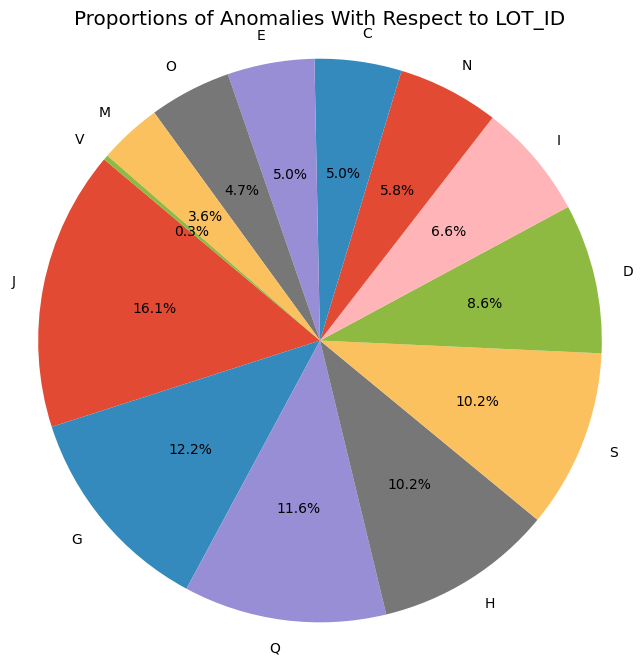

In [ ]:
# Count the occurrences of each LOT_ID
lot_id_counts = anomalous_df['LOT_ID'].value_counts().reset_index()
lot_id_counts.columns = ['LOT_ID', 'Count']

# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(lot_id_counts['Count'], labels=lot_id_counts['LOT_ID'], autopct='%1.1f%%', startangle=140)
plt.title('Proportions of Anomalies With Respect to LOT_ID')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

### Anomaly Visualization

To visualize high dimensional data, we do dimensionality reduction. In our case, t-SNE was chosen as the dimensionality reduction method as it can capture complex nonlinear relationships in the data.

In [ ]:
# Convert the sparse matrix to a dense numpy array

# Apply t-SNE
tsne = TSNE(n_components=3, perplexity=30, n_iter=250, random_state=42, verbose=2)
Y_tsne = tsne.fit_transform(Y)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 14388 samples in 0.002s...
[t-SNE] Computed neighbors for 14388 samples in 2.283s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14388
[t-SNE] Computed conditional probabilities for sample 2000 / 14388
[t-SNE] Computed conditional probabilities for sample 3000 / 14388
[t-SNE] Computed conditional probabilities for sample 4000 / 14388
[t-SNE] Computed conditional probabilities for sample 5000 / 14388
[t-SNE] Computed conditional probabilities for sample 6000 / 14388
[t-SNE] Computed conditional probabilities for sample 7000 / 14388
[t-SNE] Computed conditional probabilities for sample 8000 / 14388
[t-SNE] Computed conditional probabilities for sample 9000 / 14388
[t-SNE] Computed conditional probabilities for sample 10000 / 14388
[t-SNE] Computed conditional probabilities for sample 11000 / 14388
[t-SNE] Computed conditional probabilities for sample 12000 / 14388
[t-SNE] Computed conditional probabilities for sam

In [ ]:
tsne_df = pd.DataFrame(Y_tsne, columns=['Component 1', 'Component 2', 'Component 3'])
tsne_df['Run'] = df['Run']
fig = px.scatter_3d(tsne_df, x='Component 1', y='Component 2', z='Component 3',
              color='Run')
fig.update_layout(title_text='3D Representation of Dataset With Respect to Run')
fig.show()

In [ ]:
tsne_df = pd.DataFrame(Y_tsne, columns=['Component 1', 'Component 2', 'Component 3'])
tsne_df['Is_Anomaly'] = tsne_df.index.isin(anomaly_indices)
fig = px.scatter_3d(tsne_df, x='Component 1', y='Component 2', z='Component 3',
              color='Is_Anomaly')
fig.update_layout(title_text='3D Representation of Dataset With Respect to Anomalies')
fig.show()

In [ ]:
# Convert the sparse matrix to a dense numpy array

# Apply t-SNE
tsne = TSNE(n_components=1, perplexity=30, n_iter=250, random_state=42, verbose=2)
Y_tsne = tsne.fit_transform(Y)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 14388 samples in 0.002s...
[t-SNE] Computed neighbors for 14388 samples in 2.073s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14388
[t-SNE] Computed conditional probabilities for sample 2000 / 14388
[t-SNE] Computed conditional probabilities for sample 3000 / 14388
[t-SNE] Computed conditional probabilities for sample 4000 / 14388
[t-SNE] Computed conditional probabilities for sample 5000 / 14388
[t-SNE] Computed conditional probabilities for sample 6000 / 14388
[t-SNE] Computed conditional probabilities for sample 7000 / 14388
[t-SNE] Computed conditional probabilities for sample 8000 / 14388
[t-SNE] Computed conditional probabilities for sample 9000 / 14388
[t-SNE] Computed conditional probabilities for sample 10000 / 14388
[t-SNE] Computed conditional probabilities for sample 11000 / 14388
[t-SNE] Computed conditional probabilities for sample 12000 / 14388
[t-SNE] Computed conditional probabilities for sam

In [ ]:
# Create the DataFrame
tsne_df = pd.DataFrame(Y_tsne, columns=['1d representation'])
tsne_df['Is_Anomaly'] = tsne_df.index.isin(anomaly_indices)
tsne_df['TimeStamp'] = pd.to_datetime(df['TimeStamp'])
tsne_df['LOT_ID'] = df['LOT_ID']

# Add the index as a column to be used in the tooltip
tsne_df['Index'] = tsne_df.index

# Create the scatter plot
fig = px.scatter(tsne_df, x='TimeStamp', y='1d representation', color='Is_Anomaly', opacity=0.6, hover_data=['Index', 'LOT_ID'])
fig.update_layout(title_text='1D Representation of Dataset With Respect to Time (With Flagged Anomalies)')
fig.show()

# Hover over a specific data point to see more details

<ipython-input-53-960324d64b96>:4: UserWarning:

Parsing dates in %d/%m/%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Filter for only anomalies
filtered_df = tsne_df[tsne_df['Is_Anomaly']]
# Ensure anomaly_scores is a 2D array
anomaly_scores_fit = np.array(anomaly_scores).reshape(-1, 1)
# Scale the anomaly scores
filtered_df['anomaly_scores'] = scaler.fit_transform(anomaly_scores_fit)

# Create the scatter plot
fig = px.scatter(filtered_df, x='TimeStamp', y='1d representation', color='anomaly_scores',
                 size='anomaly_scores', opacity=0.6, hover_data=['Index', 'LOT_ID', 'anomaly_scores'])

fig.update_layout(title_text='1D Representation of Dataset With Respect to Time (With Only Anomalies)')
fig.show()

# Hover over a specific data point to see more details

Greater amounts of large anomalies occurred approximately at 08:00 and 10:00 on Mar 22, 2023 in LOT_ID H and J